In [1]:
# Import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
products = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

In [3]:
products.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [4]:
products.shape

(1050, 15)

In [5]:
products.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [6]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

### Valeurs manquantes

In [7]:
# Nombre de valeurs manquantes par colonne
products.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [8]:
# Les valeurs manquantes pour la variable "brand" sont remplacés par "unknown".
products["brand"].fillna("unknown", inplace=True)

In [9]:
products = products.dropna()

In [10]:
products.isna().sum()

uniq_id                    0
crawl_timestamp            0
product_url                0
product_name               0
product_category_tree      0
pid                        0
retail_price               0
discounted_price           0
image                      0
is_FK_Advantage_product    0
description                0
product_rating             0
overall_rating             0
brand                      0
product_specifications     0
dtype: int64

In [11]:
products.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

### Visualisation des colonnes de text

In [13]:
products["product_category_tree"][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [14]:
products["description"][0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [15]:
products["product_specifications"][0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

### Les catégories produits

Chaque produit est catégorisé par un système d'arbres à plusieurs niveaux => product_category_tree

In [12]:
# Exemple de la catégorie d'un produit
print(products["product_category_tree"][0])

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]


In [13]:
import json 

In [14]:
def product_category_tree_decode(json_str):
    cat_list = json.loads(json_str.lower())
    assert(isinstance(cat_list, list))
    assert(len(cat_list) == 1)
    return [s.strip() for s in cat_list[0].split('>>')]

In [15]:
products['product_category_tree'] = products['product_category_tree'].apply(product_category_tree_decode)
products[[f"product_category_{i}" for i in range(7)]] = pd.DataFrame(products['product_category_tree'].tolist(), index= products.index)

In [16]:
products

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,overall_rating,brand,product_specifications,product_category_0,product_category_1,product_category_2,product_category_3,product_category_4,product_category_5,product_category_6
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[home furnishing, curtains & accessories, curt...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,...,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",home furnishing,curtains & accessories,curtains,elegance polyester multicolor abstract eyelet ...,None,None,None
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[baby care, baby bath & skin, baby bath towels...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,...,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",baby care,baby bath & skin,baby bath towels,sathiyas baby bath towels,"sathiyas cotton bath towel (3 bath towel, red,...",None,None
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[home furnishing, bed linen, bedsheets, santos...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,...,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",home furnishing,bed linen,bedsheets,santosh royal fashion bedsheets,santosh royal fashion cotton printed king size...,None,None
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[home furnishing, bed linen, bedsheets, jaipur...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,...,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",home furnishing,bed linen,bedsheets,jaipur print bedsheets,jaipur print cotton floral king sized double b...,None,None
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[watches, wrist watches, maserati time wrist w...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,...,No rating available,unknown,"{""product_specification""=>[{""key""=>""Chronograp...",watches,wrist watches,maserati time wrist watches,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[baby care, baby & kids gifts, stickers, oren ...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,...,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ...",baby care,baby & kids gifts,stickers,oren empower stickers,None,None,None
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[baby care, baby & kids gifts, stickers, wallm...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,...,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ...",baby care,baby & kids gifts,stickers,wallmantra stickers,None,None,None
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[baby care, baby & kids gifts, stickers, uberl...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d1

In [17]:
print(products["product_category_0"][0])

home furnishing


In [18]:
products["product_category_0"]

0       home furnishing
1             baby care
3       home furnishing
4       home furnishing
5               watches
             ...       
1045          baby care
1046          baby care
1047          baby care
1048          baby care
1049          baby care
Name: product_category_0, Length: 1048, dtype: object

In [23]:
products["product_category_0"].nunique()

7

In [24]:
products["product_category_0"].unique()

array(['home furnishing', 'baby care', 'watches',
       'home decor & festive needs', 'kitchen & dining',
       'beauty and personal care', 'computers'], dtype=object)

In [19]:
print(products["product_category_1"][0])

curtains & accessories


In [26]:
products["product_category_1"].nunique()

62

**product_category_0**

In [27]:
font_title = {"weight": "bold",
              "size": 20}

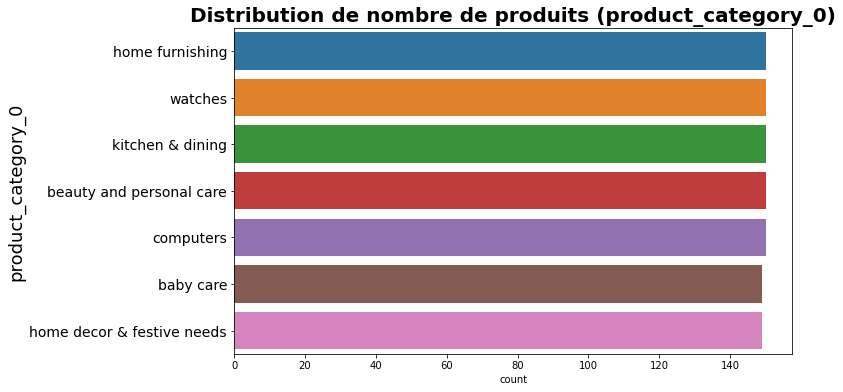

In [28]:
fig = plt.figure(figsize=(10, 6))
sns.countplot(data=products, y="product_category_0",
             order = products["product_category_0"].value_counts().index,)
plt.yticks(size=14)
plt.title(f"Distribution de nombre de produits (product_category_0)",
          fontdict=font_title)
plt.ylabel("product_category_0", fontsize=18)
plt.show()

**product_category_1**

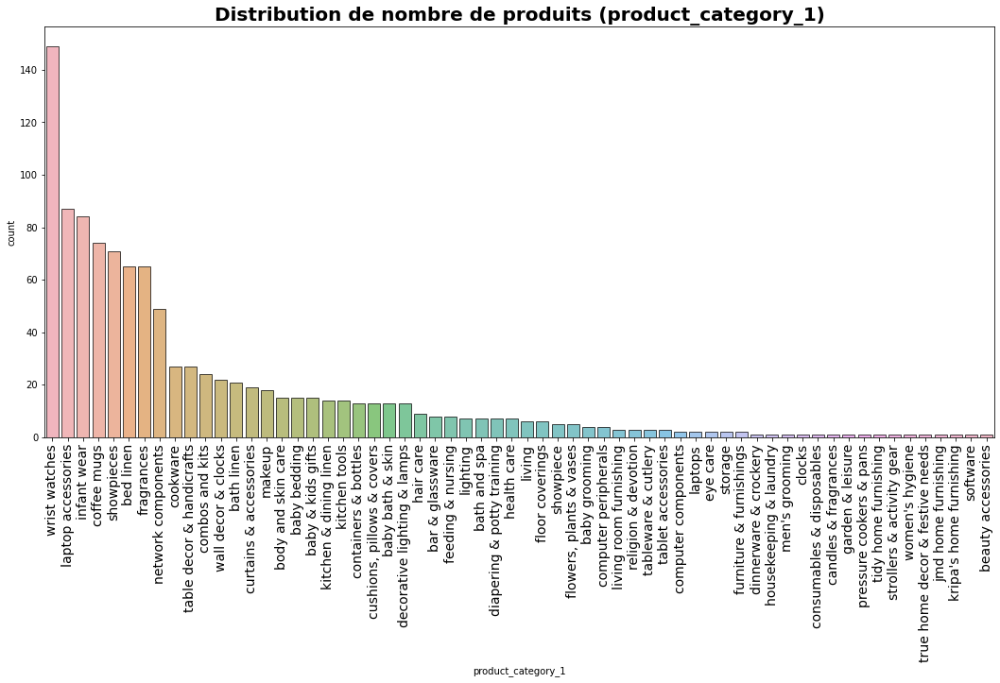

In [29]:
fig = plt.figure(figsize=(18, 8))
sns.countplot(data=products, x="product_category_1",
              edgecolor="black",
              order = products['product_category_1'].value_counts().index,
              alpha=0.7)
plt.xticks(rotation=90, size=14)
plt.title(f"Distribution de nombre de produits (product_category_1)",
          fontdict=font_title)
plt.show()

In [20]:
# Les catégories utilisés pour la résolution du problème de segmentation
categories = products["product_category_0"]

In [21]:
products["product_category_0"].unique()

array(['home furnishing', 'baby care', 'watches',
       'home decor & festive needs', 'kitchen & dining',
       'beauty and personal care', 'computers'], dtype=object)

### Preparation de df avec la nouvelle variable de description: "product_name", "description" 

In [22]:
text_data = pd.DataFrame()
text_data["uniq_id"] = products["uniq_id"]
text_data["category"] = products["product_category_0"]
text_data["description"] = products["product_name"] + " " + products["description"]
text_data

,uniq_id,category,description
0,55b85ea15a1536d46b7190ad6fff8ce7,home furnishing,Elegance Polyester Multicolor Abstract Eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,baby care,Sathiyas Cotton Bath Towel Specifications of S...
3,d4684dcdc759dd9cdf41504698d737d8,home furnishing,SANTOSH ROYAL FASHION Cotton Printed King size...
4,6325b6870c54cd47be6ebfbffa620ec7,home furnishing,Jaipur Print Cotton Floral King sized Double B...
5,893aa5ed55f7cff2eccea7758d7a86bd,watches,Maserati Time R8851116001 Analog Watch - For ...
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,baby care,Oren Empower Extra Large Self Adhesive Sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,baby care,Wallmantra Large Vinyl Sticker Sticker Wallman...
1047,5912e037d12774bb73a2048f35a00009,baby care,Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,baby care,Wallmantra Medium Vinyl Sticker Sticker Buy Wa...


In [23]:
text_data

,uniq_id,category,description
0,55b85ea15a1536d46b7190ad6fff8ce7,home furnishing,Elegance Polyester Multicolor Abstract Eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,baby care,Sathiyas Cotton Bath Towel Specifications of S...
3,d4684dcdc759dd9cdf41504698d737d8,home furnishing,SANTOSH ROYAL FASHION Cotton Printed King size...
4,6325b6870c54cd47be6ebfbffa620ec7,home furnishing,Jaipur Print Cotton Floral King sized Double B...
5,893aa5ed55f7cff2eccea7758d7a86bd,watches,Maserati Time R8851116001 Analog Watch - For ...
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,baby care,Oren Empower Extra Large Self Adhesive Sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,baby care,Wallmantra Large Vinyl Sticker Sticker Wallman...
1047,5912e037d12774bb73a2048f35a00009,baby care,Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,baby care,Wallmantra Medium Vinyl Sticker Sticker Buy Wa...


## Nettoyage et preparation de donees textuelles

### Nettoyage du texte

In [34]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lemis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [35]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lemis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [42]:
# Tokenizer
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ').replace('[', ' ').replace(']', ' ').replace(',', ' ').replace('.', ' ').replace(':', ' ').replace('?', ' ').replace('(', ' ').replace(')', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
stop_w = list(set(stopwords.words('english'))) 

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

# Fonction de préparation du texte pour le bag of words avec lemmatization
def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
#    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(word_tokens)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

text_data['sentence_bow'] = text_data['description'].apply(lambda x : transform_bow_fct(x))
text_data['sentence_bow_lem'] = text_data['description'].apply(lambda x : transform_bow_lem_fct(x))
text_data['sentence_dl'] = text_data['description'].apply(lambda x : transform_dl_fct(x))
text_data.shape

(1048, 6)

In [43]:
# Stop words
stop_words = set()
stop_words.update(tuple(nltk.corpus.stopwords.words('english')))

# wordnet lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

# porter stemmer
#porter_stemmer = PorterStemmer()

# snowball stemmer
#snowball_stemmer = SnowballStemmer('english')

# j'obtiens de meilleurs resultats avec seulement le wordnet lemmatizer !

# Pontuation
stop_words.update(('.', '..', '...', ',', '"', "'", "''", '`', '``', '?', '!', ':', ';'))
stop_words.update(('(', ')', '[', ']', '{', '}'))
stop_words.update(('-', '~', '&', '/', '#', '%', '*', '=', '+'))

# other words
stop_words.update(("'s"))

In [44]:
def description_tokenize(x, sw):
    _x = []
    if not isinstance(x, list):
        _wt = word_tokenize(x)
    else:
        _wt = x
    for _w in _wt:
        if _w not in sw and not _w.lstrip('-').replace('.', '', 1).isnumeric():
            _x.append(_w)
    return _x

text_data['description_tok'] = text_data['description'].apply(lambda x: description_tokenize(x, sw=stop_words))


In [45]:
text_data['description_tok']

0       [Elegance, Polyester, Multicolor, Abstract, Ey...
1       [Sathiyas, Cotton, Bath, Towel, Specifications...
3       [SANTOSH, ROYAL, FASHION, Cotton, Printed, Kin...
4       [Jaipur, Print, Cotton, Floral, King, sized, D...
5       [Maserati, Time, R8851116001, Analog, Watch, F...
                              ...                        
1045    [Oren, Empower, Extra, Large, Self, Adhesive, ...
1046    [Wallmantra, Large, Vinyl, Sticker, Sticker, W...
1047    [Uberlyfe, Extra, Large, Pigmented, Polyvinyl,...
1048    [Wallmantra, Medium, Vinyl, Sticker, Sticker, ...
1049    [Uberlyfe, Large, Vinyl, Sticker, Buy, Uberlyf...
Name: description_tok, Length: 1048, dtype: object

In [46]:
text_data['description_tok'] = text_data['description_tok'].apply(lambda x: ' '.join(x))

In [47]:
text_data['description_tok']

0       Elegance Polyester Multicolor Abstract Eyelet ...
1       Sathiyas Cotton Bath Towel Specifications Sath...
3       SANTOSH ROYAL FASHION Cotton Printed King size...
4       Jaipur Print Cotton Floral King sized Double B...
5       Maserati Time R8851116001 Analog Watch For Boy...
                              ...                        
1045    Oren Empower Extra Large Self Adhesive Sticker...
1046    Wallmantra Large Vinyl Sticker Sticker Wallman...
1047    Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048    Wallmantra Medium Vinyl Sticker Sticker Buy Wa...
1049    Uberlyfe Large Vinyl Sticker Buy Uberlyfe Larg...
Name: description_tok, Length: 1048, dtype: object

### Comparaison description vs. clean text

**Before cleaning**

In [42]:
text_data['description'][0] 

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant

**After cleaning**

In [41]:
text_data['description_tok'][0] 

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain Elegance Polyester Multicolor Abstract Eyelet Door Curtain cm Height Pack Price Rs This curtain enhances look interiors.This curtain made high quality polyester fabric.It features eyelet style stitch Metal Ring.It makes room environment romantic loving.This curtain ant- wrinkle anti shrinkage elegant apparance.Give home bright modernistic appeal designs The surreal attention sure steal hearts These contemporary eyelet valance curtains slide smoothly draw apart first thing morning welcome bright sun rays want wish good morning whole world draw close evening create special moments joyous beauty given soothing prints Bring home elegant curtain softly filters light room get right amount sunlight. Specifications Elegance Polyester Multicolor Abstract Eyelet Door Curtain cm Height Pack General Brand Elegance Designed For Door Type Eyelet Model Nam

**Other examples**

In [43]:
description = text_data.loc[text_data.uniq_id == "55b85ea15a1536d46b7190ad6fff8ce7"]
print("Text before cleaning : \n \n {}".format(description["description"].iloc[0]))

Text before cleaning : 
 
 Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prin

In [44]:
print("Text after cleaning : \n \n {}".format(description["sentence_dl"].iloc[0])) 

Text after cleaning : 
 
 elegance polyester multicolor abstract eyelet door curtain key features of elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 cm in height pack of 2 price rs 899 this curtain enhances the look of the interiors this curtain is made from 100 % high quality polyester fabric it features an eyelet style stitch with metal ring it makes the room environment romantic and loving this curtain is ant wrinkle and anti shrinkage and have elegant apparance give your home a bright and modernistic appeal with these designs the surreal attention is sure to steal hearts these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints bring 

In [45]:
print("Text after cleaning : \n \n {}".format(description["sentence_bow_lem"].iloc[0])) 

Text after cleaning : 
 
 elegance polyester multicolor abstract eyelet door curtain key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 height pack price 899 this curtain enhances look interior this curtain made 100 high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving this curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design the surreal attention sure steal heart these contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain 213 height pack general brand elegance designed for door type eyel

In [46]:
print("Text after cleaning : \n \n {}".format(description["sentence_bow"].iloc[0]))

Text after cleaning : 
 
 elegance polyester multicolor abstract eyelet door curtain key features elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 height pack price 899 this curtain enhances look interiors this curtain made 100 high quality polyester fabric features eyelet style stitch metal ring makes room environment romantic loving this curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal designs the surreal attention sure steal hearts these contemporary eyelet valance curtains slide smoothly draw apart first thing morning welcome bright sun rays want wish good morning whole world draw close evening create special moments joyous beauty given soothing prints bring home elegant curtain softly filters light room get right amount sunlight specifications elegance polyester multicolor abstract eyelet door curtain 213 height pack general brand elegance designed for do

In [47]:
text_data.to_csv("text_data_P6.csv", index = False)

In [48]:
from wordcloud import WordCloud

In [49]:
def plot_wordclouds_from_gb(gb, n_top_words, n_rows=1, figsize=(18,8),
                             backgnd_color='black', cmap='Dark2',
                            random_state=None):
    '''Takes a groupby made on a series of texts (non tokenized),
    (-> for example : gb = df_desc_cat.groupby('category')['desc_clean'])
    extracts the n top words and plots a wordcloud of the (n_top_words)
    top words for each topic.
    '''

    fig = plt.figure(figsize=figsize)

    for i, tup in enumerate(gb,1):
        n_topic, ser_texts = tup
        # creation of a corpus of all the cleaned descriptions and product_names
        corpus = ' '.join(ser_texts.values)
        # tokenizing the words in the cleaned corpus
        tokenizer = nltk.RegexpTokenizer(r'[a-z]+')
        li_words = tokenizer.tokenize(corpus.lower())
        # counting frequency of each word
        ser_freq = pd.Series(nltk.FreqDist(li_words))

        wc = WordCloud(stopwords=None, background_color=backgnd_color,
                        colormap=cmap, max_font_size=150,
                        random_state=14)
        ser_topic = ser_freq\
            .sort_values(ascending=False)[0:n_top_words]
        wc.generate(' '.join(list(ser_topic.index)))

        n_tot = len(gb)
        n_cols = (n_tot//n_rows)+((n_tot%n_rows)>0)*1
        ax = fig.add_subplot(n_rows,n_cols,i)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.tight_layout()
        plt.title(n_topic, fontweight='bold')

**Wordclouds par categories produit**

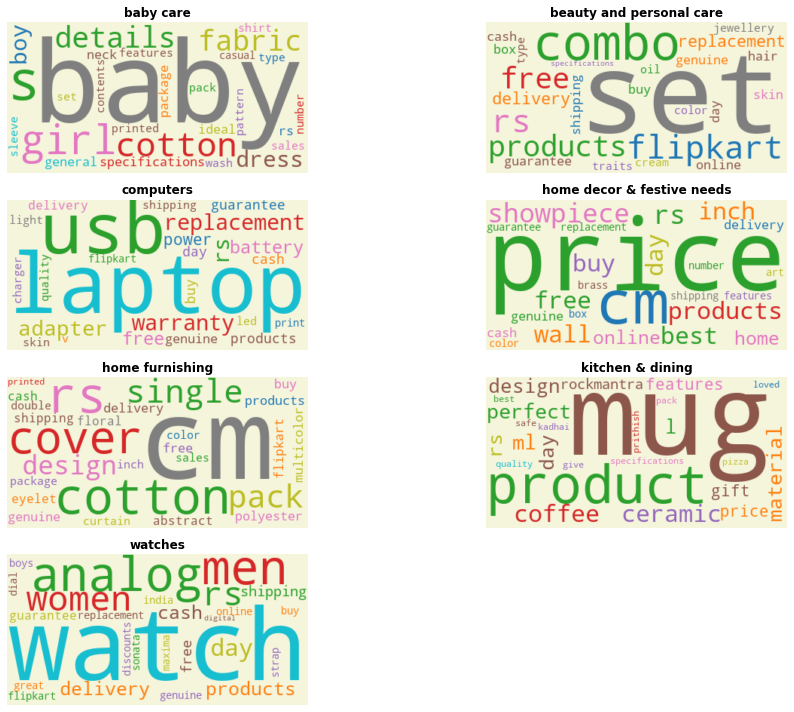

In [50]:
gb = text_data.groupby('category')['description_tok']

plot_wordclouds_from_gb(gb, n_top_words=30, n_rows=4, figsize=(15,10),
                        backgnd_color='beige', cmap='tab10', random_state=14)

## Préparation commune des traitements

In [48]:
# Import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import pickle
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition
import logging

logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere

In [49]:
import sklearn.preprocessing

In [50]:
l_cat = list(set(text_data['category']))
print("catégories : ", l_cat)
y_cat_num = [(1-l_cat.index(text_data.iloc[i]['category'])) for i in range(len(text_data))]

catégories :  ['computers', 'watches', 'baby care', 'kitchen & dining', 'beauty and personal care', 'home furnishing', 'home decor & festive needs']


In [51]:
from nltk.tokenize import sent_tokenize, word_tokenize

text_data['length_bow'] = text_data['sentence_bow'].apply(lambda x : len(word_tokenize(x)))
print("max length bow : ", text_data['length_bow'].max())
text_data['length_dl'] = text_data['sentence_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", text_data['length_dl'].max())

max length bow :  382
max length dl :  593


### Fonctions communes

In [52]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, labels) :
    time1 = time.time()
    n_labels = preprocessing.LabelEncoder().fit_transform(labels.values)
    n_clusters = len(set(n_labels))
    num_labels=len(l_cat)
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(n_labels, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Categorie")
    plt.title('Représentation des produits par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Représentation des produits par clusters')
    
    plt.show()
    print("ARI : ", ARI)


## Bag of word - Tf-idf

**BOW** - It’s an algorithm that transforms the text into fixed-length vectors. This is possible by counting the number of times the word is present in a document. The word occurrences allow to compare different documents and evaluate their similarities for applications, such as search, document classification, and topic modeling.

**Term Frequency (TF)** - The number of times a word appears in a document divded by the total number of words in the document.

**Inverse Data Frequency (IDF)** - The log of the number of documents divided by the number of documents that contain the word w. Inverse data frequency determines the weight of rare words across all documents in the corpus.

### Préparation sentences

In [53]:
# création du bag of words (CountVectorizer et Tf-idf)

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'description_tok'
cv_transform = cvect.fit_transform(text_data[feat])
ctf_transform = ctf.fit_transform(text_data[feat])

### Exécution des modèles

**CountVectorizer**

In [54]:
print("CountVectorizer : ")
print("-----------------")
ARI, X_tsne, labels = ARI_fct(cv_transform,text_data['category'] )

CountVectorizer : 
-----------------
ARI :  0.4329 time :  8.0


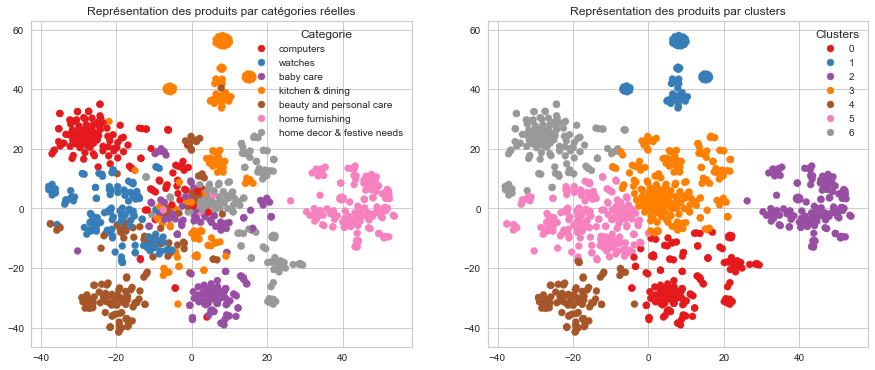

ARI :  0.4329


In [55]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [56]:
sil = silhouette_score(X_tsne,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.1548811


**Tf-idf**

In [57]:
print("Tf-idf : ")
print("--------")
ARI, X_tsne, labels = ARI_fct(ctf_transform, text_data['category'])

Tf-idf : 
--------
ARI :  0.5927 time :  7.0


### Graphiques

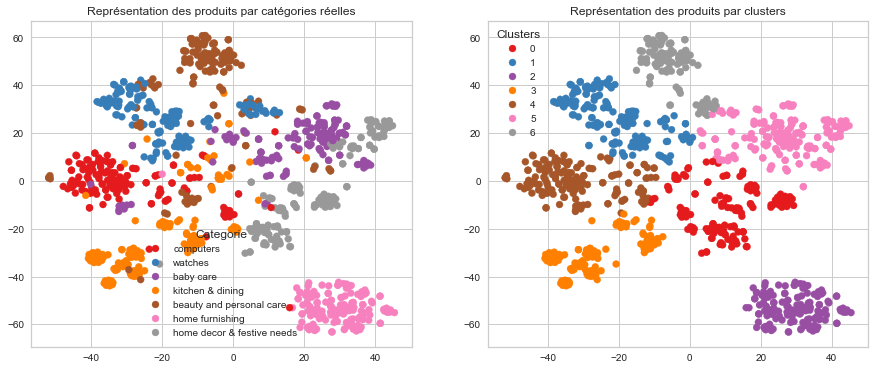

ARI :  0.5927


In [58]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [59]:
sil = silhouette_score(X_tsne,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.15445523


## Word2Vec

In [62]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

### Création du modèle Word2Vec

In [213]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = text_data['description_tok'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [214]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 5171
Word2Vec trained


In [215]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 5172


### Création de la matrice d'embedding

In [216]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (5172, 300)


### Création du modèle d'embedding

In [217]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_1 (Embedding)     (None, 24, 300)           1551600   
                                                                 
 global_average_pooling1d_1   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,551,600
Trainable params: 1,551,600
Non-trainable params: 0
_________________________________________________________________


### Exécution du modèle

In [218]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 1ms/step


(1048, 300)

In [219]:
ARI, X_tsne, labels = ARI_fct(embeddings, text_data['category'])

ARI :  0.1938 time :  8.0


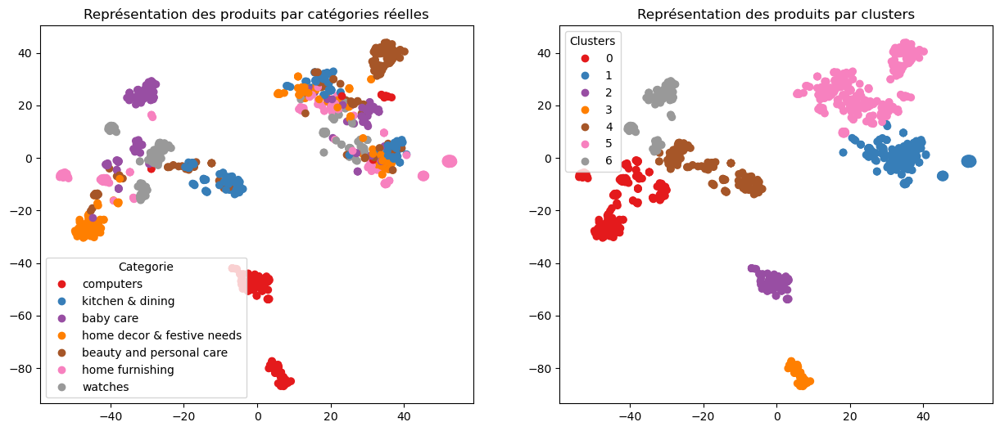

ARI :  0.1938


In [220]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

## BERT

In [83]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [84]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.1
2.9.1
Num GPUs Available:  0
True


### Fonctions communes

In [85]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot

In [88]:
# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

**'bert-base-uncased'**

In [86]:
max_length = 64
batch_size = 1
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = text_data['description_tok'].to_list()

In [89]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 0s 137ms/step
temps traitement :  186.0


In [90]:
ARI, X_tsne, labels = ARI_fct(features_bert, text_data['category'])

ARI :  0.4145 time :  8.0


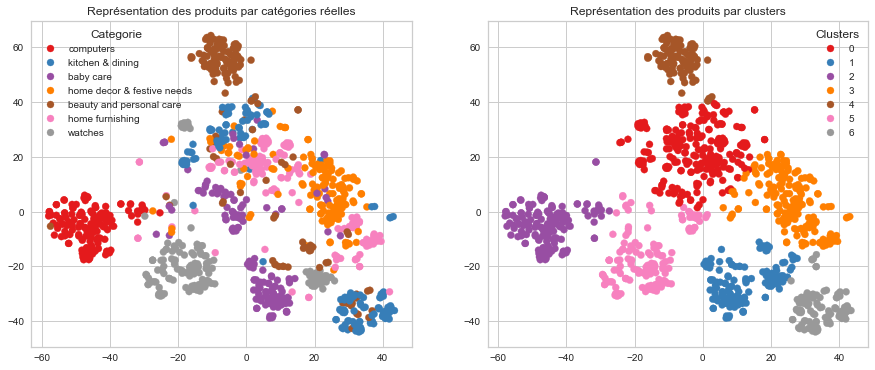

ARI :  0.4145


In [91]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

### BERT hub Tensorflow

In [99]:
! pip install tensorflow_text

In [206]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/3'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [207]:
sentences = text_data['description_tok'].to_list()

In [208]:
max_length = 64
batch_size = 1
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  204.0


In [209]:
ARI, X_tsne, labels = ARI_fct(features_bert, text_data['category'])

ARI :  0.4238 time :  11.0


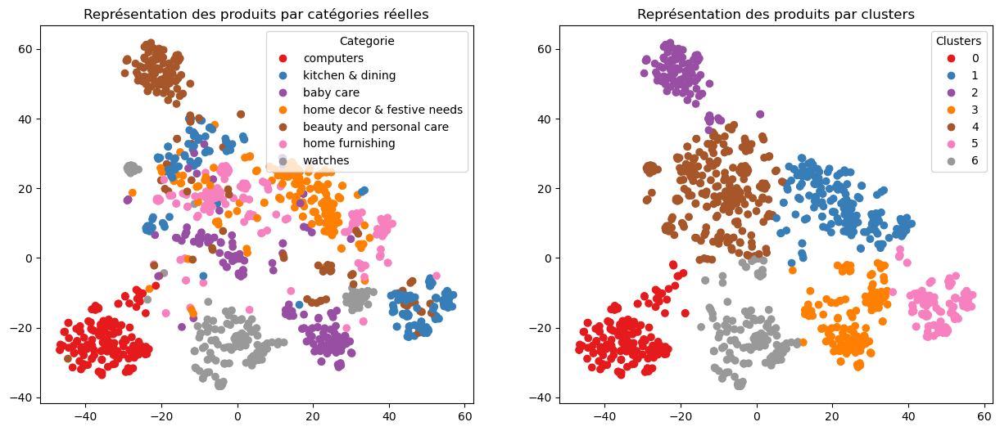

ARI :  0.4238


In [210]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

## USE - Universal Sentence Encoder

In [103]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [104]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.1
2.9.1
Num GPUs Available:  0
True


In [107]:
! pip install tensorflow_hub

In [149]:
import tensorflow_hub as hub

url = "https://tfhub.dev/google/universal-sentence-encoder-large/5"

embed = hub.load(url)

In [150]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [151]:
batch_size = 1
sentences = text_data['description_tok'].to_list()

In [152]:
features_USE = feature_USE_fct(sentences, batch_size)

In [153]:
ARI, X_tsne, labels = ARI_fct(features_USE, text_data['category'])

ARI :  0.6632 time :  8.0


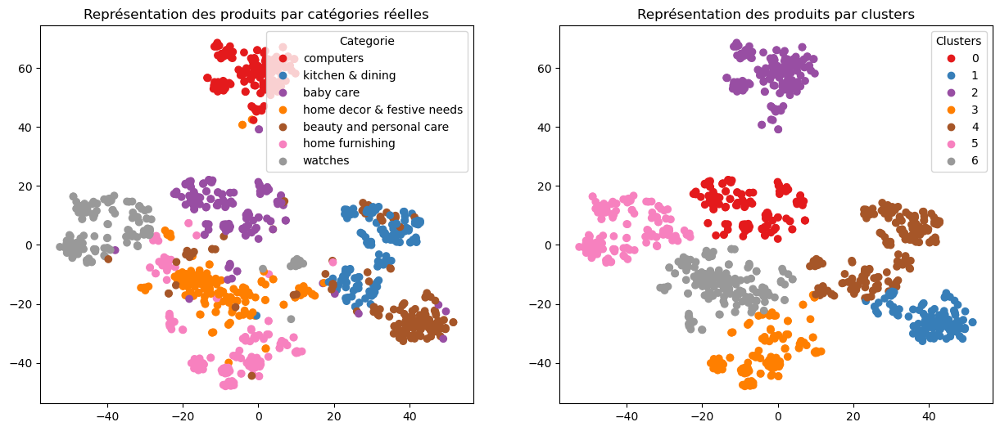

ARI :  0.6632


In [154]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

## Les images

**Affichage d'exemples d'images par catégorie (category 0)**

In [115]:
%load_ext autoreload
%autoreload 2

In [25]:
import warnings
warnings.filterwarnings("ignore")

import math
import pandas as pd
import numpy as np
import re
from unidecode import unidecode
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.image import imread
import time
import random
import operator
import scipy.cluster.hierarchy as shc
import multiprocessing
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize, FreqDist
from sklearn import (preprocessing,
                     manifold,
                     decomposition)
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.metrics import silhouette_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import NMF
from PIL import Image, ImageOps, ImageFilter
import tensorflow as tf
import keras
from keras.preprocessing import image

In [156]:
#pip install opencv-python

In [26]:
import cv2 as cv

In [27]:
path = "Images/"

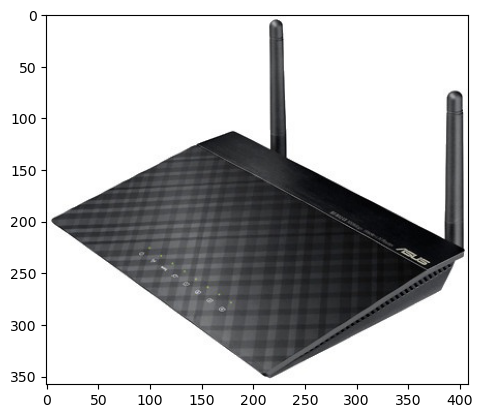

In [119]:
plt.style.use('default')
image = plt.imread("Images/394c2c627914e1eed9b8ac343583a679.jpg")
plt.imshow(image)

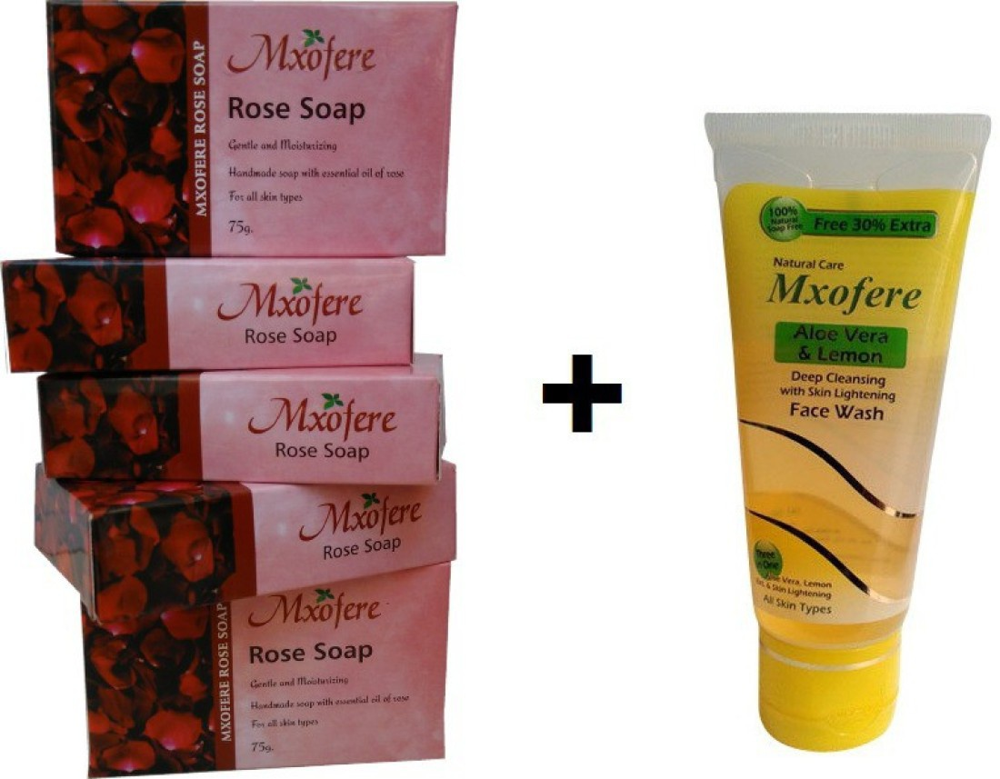

In [28]:
from IPython.display import Image
Image(filename=path+'00d84a518e0550612fcfcba3b02b6255.jpg') 

home furnishing


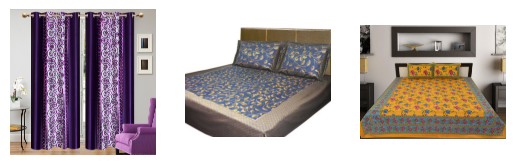

baby care


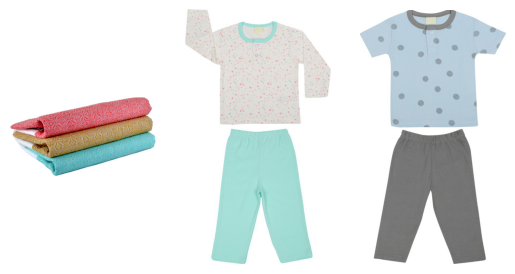

watches


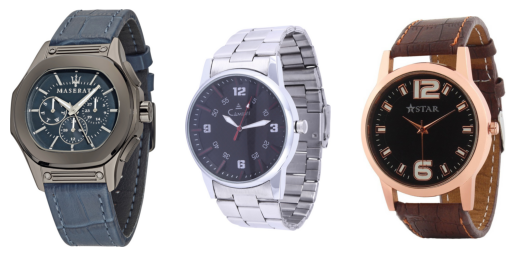

home decor & festive needs


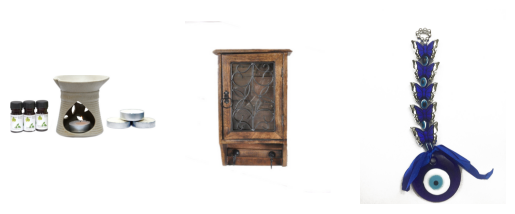

kitchen & dining


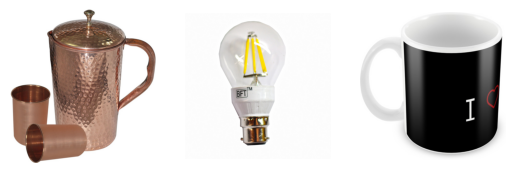

beauty and personal care


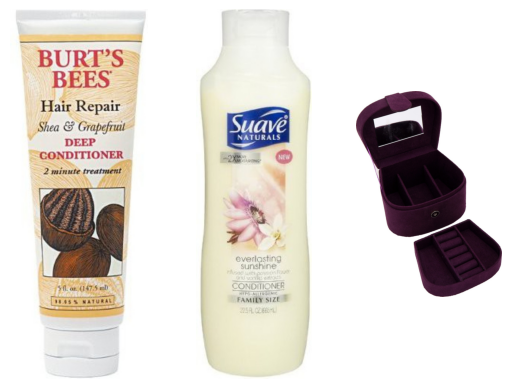

computers


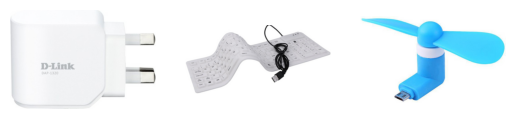

In [120]:
for j, categ in enumerate(categories.unique()) :
    bolded_string = "\033[1m" + categ + "\033[0m"
    print(bolded_string)
    # print("-------")
    for i in range(3):
        name_image = products[categories == categ]["image"].iloc[i]
        plt.subplot(130 + 1 + i)
        filename = path + name_image
        img = imread(filename)
        plt.imshow(img)
        plt.axis('off')    
    plt.show()   

### Pre-pré-traitement  des images

In [31]:
# Dataframe de travail pour le traitement des images

image_data = pd.DataFrame()
image_data["image"] = products["image"]
image_data['image_loc'] = [path + row for row in products['image']]
image_data["category"] = products["product_category_0"]

image_data

,image,image_loc,category
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Images/d4684dcdc759dd9cdf41504698d737d8.jpg,home furnishing
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,home furnishing
5,893aa5ed55f7cff2eccea7758d7a86bd.jpg,Images/893aa5ed55f7cff2eccea7758d7a86bd.jpg,watches
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Images/958f54f4c46b53c8a0a9b8167d9140bc.jpg,baby care
1046,fd6cbcc22efb6b761bd564c28928483c.jpg,Images/fd6cbcc22efb6b761bd564c28928483c.jpg,baby care
1047,5912e037d12774bb73a2048f35a00009.jpg,Images/5912e037d12774bb73a2048f35a00009.jpg,baby care
1048,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Images/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,baby care


### Illustration du pré-traitement sur une image

In [29]:
dim = (224, 224)

In [123]:
def afficher_image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image et l'histogramme de répartiton des pixels.
    Parameters
    ----------
    image : image à afficher, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.grid(False)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True, 
                           histtype='stepfilled')
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    
    plt.show()

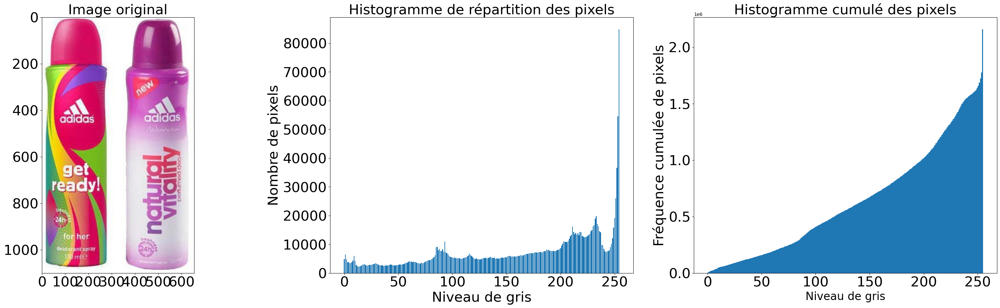

In [124]:
# Chargement de l'image originale + histogramme des pixels
img_original = Image.open('Images/fe1bd3e2be8112198506daecbac7dc5c.jpg')
afficher_image_histopixel(img_original, 'Image original')

**Correction de l'exposition (étirement d'histogramme)**

Maximize (normalize) image contrast. This function calculates a histogram of the input image (or mask region), removes cutoff percent of the lightest and darkest pixels from the histogram, and remaps the image so that the darkest pixel becomes black (0), and the lightest becomes white (255).

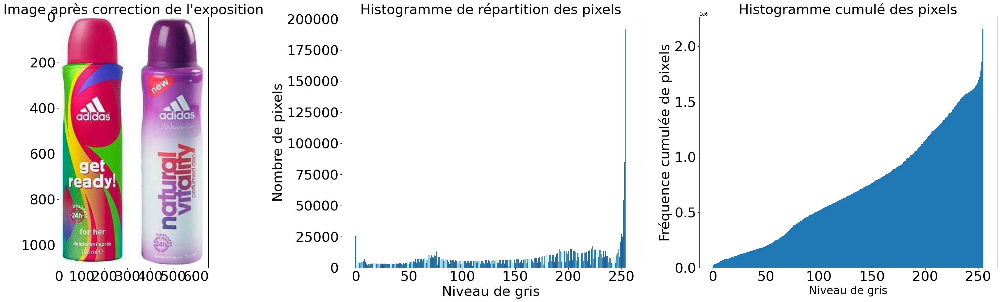

In [125]:
# Correction de l'exposition 
img_exposition = ImageOps.autocontrast(img_original, 1)
afficher_image_histopixel(img_exposition,'Image après correction de l\'exposition')

**Correction du contraste (répartition de lumière dans une image)**

Equalize the image histogram. This function applies a non-linear mapping to the input image, in order to create a uniform distribution of grayscale values in the output image.

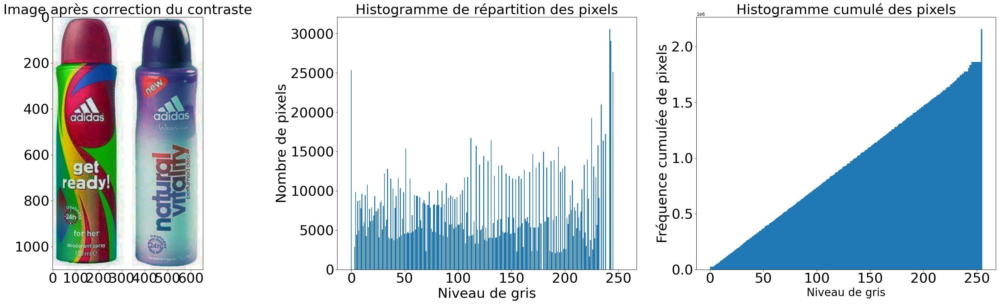

In [126]:
# Correction du contraste
img_contrast = ImageOps.equalize(img_exposition)
afficher_image_histopixel(img_contrast,'Image après correction du contraste')

**Réduction du bruit (lissage ou filtre)**

Blurs the image by setting each pixel to the average value of the pixels in a square box extending radius pixels in each direction. 

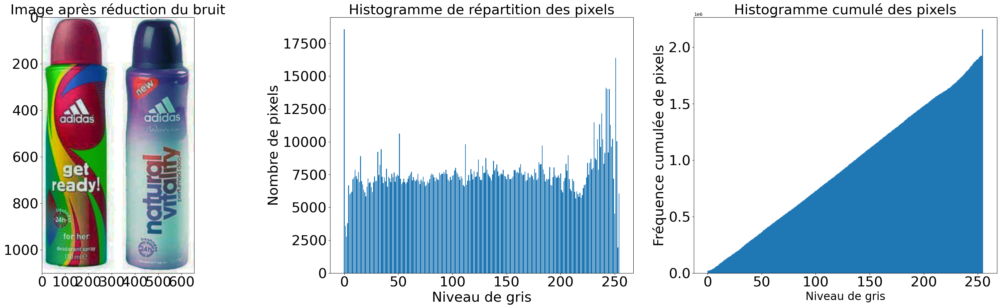

In [127]:
# Filter
img_filter = img_contrast.filter(ImageFilter.BoxBlur(1))
afficher_image_histopixel(img_filter,'Image après réduction du bruit')

**Conversion de l'image en niveau de gris pour SIFT**

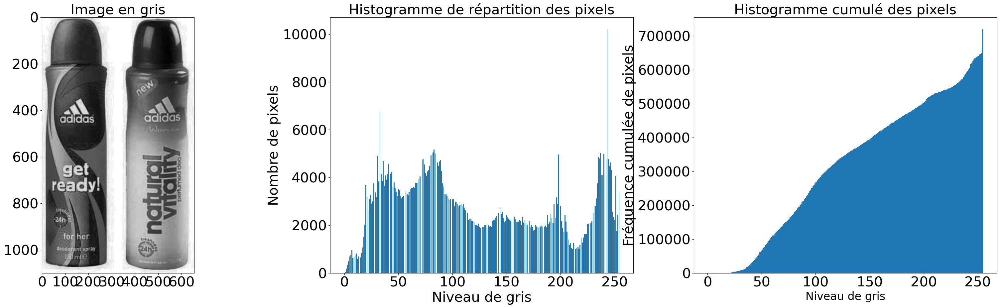

In [128]:
img_gris = cv.cvtColor(np.array(img_filter), cv.COLOR_RGB2GRAY)
afficher_image_histopixel(img_gris,'Image en gris')

**Redimensionnement 224 * 224**

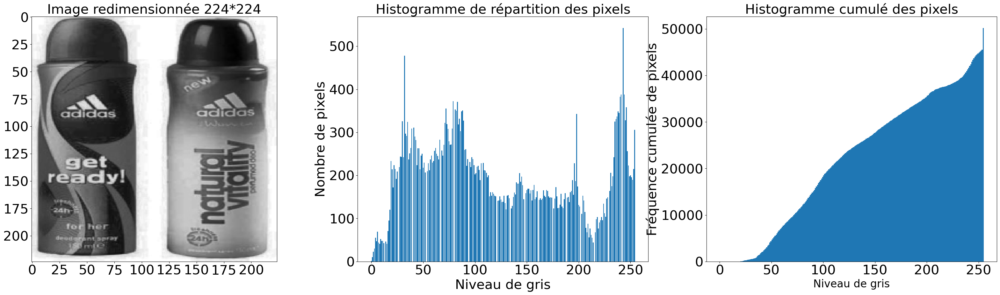

In [129]:
img_new_dimention = cv.resize(np.array(img_gris), dim,
                            interpolation=cv.INTER_AREA)
afficher_image_histopixel(img_new_dimention,'Image redimensionnée 224*224')

### Pré-traitement de toutes les images

In [130]:
def preprocess_image(image):
    '''
    le pré-traitement suivant est appliqué sur toutes les images :
    - Correction de l'exposition (étirement d'histogramme) 
    - Correction du contraste (égalisation d'histogramme)    
    - Réduction du bruit 
    - Conversion en niveau de gris de l'image (ORB, SIFT...).
    - Réduction de dimension
    Parameters
    ----------
    image : image localisée dans un répertoire, obligatoire.
    Returns
    -------
    None
    '''
    # Variables locales
    dim = (224, 224)
    dir_images_transformed = 'Images_process/'
    
    # Nom de l'image
    file_dir = os.path.split(image)

    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Correction du contraste (égalisation de l'histogramme)
    img = ImageOps.equalize(img)
    
    # Réduction du bruit 
    img = img.filter(ImageFilter.BoxBlur(1))
    
    # Conversion en niveau de gris de l'image
    img = cv.cvtColor(np.array(img), cv.COLOR_BGR2GRAY)    
    
    # Redimensionnement en 224 * 224
    img = cv.resize(np.array(img), dim, interpolation=cv.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire data/Images_process
    #cv.imwrite('../DataSet/Flipkart/Images_process/' + file_dir[1], img)

    # Transforme un array en Image
    img = Image.fromarray(img) 
    
    # Sauvegarde de l'image dans le répertoire ../DataSet/Flipkart/Images_process/
    img.save(os.path.join(dir_images_transformed, file_dir[1]))    
    
    return 'Images_process/' + file_dir[1]

In [131]:
# Pré-traitement de toutes les images
image_data['image_proces'] = \
image_data['image_loc'].apply(preprocess_image)

In [132]:
image_data.head(3)

,image,image_loc,category,image_proces
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Images_process/55b85ea15a1536d46b7190ad6fff8ce...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Images_process/7b72c92c2f6c40268628ec5f14c6d59...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Images/d4684dcdc759dd9cdf41504698d737d8.jpg,home furnishing,Images_process/d4684dcdc759dd9cdf41504698d737d...


### Extraction des features pour algorithme SIFT (Scale Invariant Feature Transform)

3 étapes :

- Récupérer les descripteurs de chaque image par un algorithme de type SIFT
- Clusteriser l'ensemble de tous les descripteurs
- Construction de l'histogramme pour chaque image (Bag of Visual Words)

**Exemple (1 image)**

In [24]:
import time
import pandas as pd
import numpy as np
import string as st
import re
import os
from scipy import stats
from scipy.spatial import distance
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import seaborn as sns
import matplotlib.cm as cm
from sklearn import (preprocessing,
                     manifold,
                     decomposition)
from sklearn import metrics
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import MeanShift, estimate_bandwidth
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from sklearn.metrics.cluster import adjusted_rand_score
from math import radians, cos, sin, asin, sqrt
import nltk
from nltk.corpus import stopwords
from nltk import PorterStemmer, WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import NMF
from sklearn.preprocessing import FunctionTransformer
from scipy.optimize import linear_sum_assignment

from PIL import Image, ImageOps, ImageFilter
import cv2 as cv
from sklearn.metrics import pairwise_distances_argmin_min
import warnings

In [134]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\lemis\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [135]:
# Chargement de l'image précédemment traitée (The function imread loads an image from the specified file and returns it)
deodorant = cv.imread('Images_process/fe1bd3e2be8112198506daecbac7dc5c.jpg')

In [136]:
def gen_sift_features(gray_img):
    sift = cv.SIFT_create()
    # kp is the keypoints
    # desc is the SIFT descriptors, they're 128-dimensional vectors
    # that we can use for our final features
    kp, desc = sift.detectAndCompute(gray_img, None)
    return kp, desc

In [137]:
# Transformation del'image en matrice de pixels pour OpenCV
deodorant = np.array(deodorant)

# Extraction des keypoints et descripteurs SIFT
sift_keypoints, sift_descripteurs = gen_sift_features(deodorant)

In [138]:
print(f"L'image contient {sift_descripteurs.shape[0]} descripteurs SIFT")
print(f'Chaque descripteur est un vecteur de longueur {sift_descripteurs.shape[1]}')

L'image contient 373 descripteurs SIFT
Chaque descripteur est un vecteur de longueur 128


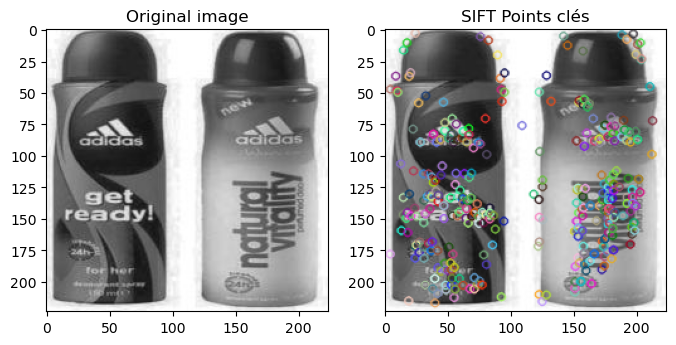

In [139]:
# Visualisation des points d'intérêt
sift_deodorant_keypoints = cv.drawKeypoints(deodorant, sift_keypoints, None)

plt.figure(figsize=(8, 4))
plt.grid(False)

# Image originale
plt.subplot(1, 2, 1)
plt.grid(False)
plt.title('Original image')
plt.imshow(deodorant)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.grid(False)
plt.imshow(sift_deodorant_keypoints)
plt.title('SIFT Points clés')

plt.show()

**Extraction des descripteurs SIFT sur l'ensemble des images**

In [140]:
def load_image_in_dict(repertoire):
    # Chargement des images pré-traitées dans un dictionnaire d'images
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv.imread(path, 0)
        images[filename] = img
    return images

In [141]:
# Chargement des images pré-traitées dans le dictionnaire images
images = load_image_in_dict('Images_process')
print(f'{len(images)} images chargées')

1048 images chargées


In [142]:
def sift_features(images):
    '''
    Extraire les descripteurs et keypoints avec SIFT.
    Parameters
    ----------
    images : les images dont on veut extraire les descripteurs et keypoints
    
    Returns
    -------
    list des descripteurs et des vecteurs SIFT.
    '''
    sift_vectors = {}
    descriptor_list = []
    sift = cv.SIFT_create()
    for key, value in images.items():
        features = []
        kp, des = sift.detectAndCompute(value, None)
        descriptor_list.extend(des)
        # in case no descriptor
        des = [np.zeros((128,))] if des is None else des
        features.append(des)
        sift_vectors[key] = features
    return [descriptor_list, sift_vectors]

In [143]:
#Extraction des descripteurs SIFT
sifts = sift_features(images)

In [144]:
# Liste des descripteurs
descriptor_list = sifts[0] 
# Liste des vecteurs par images (dictionnaires clé=nom_image, vecteur)
all_bovw_feature = sifts[1]

print("Nombre de descripteurs : ", len(descriptor_list))

Nombre de descripteurs :  379529


 **Clustering des descripteurs**

On va créer des clusters à partir des descripteurs (avec K-Means). Le centre de chaque groupe sera utilisé comme vocabulaire du dictionnaire visuel.

La regle: On doit créer k clusters avec k = nombre de catégories * 10 (il y a 7 catégories, donc k = 70)

In [145]:
n_clusters = 70

In [146]:
def kmeans(k, descriptor_list):
    kmeans = KMeans(n_clusters = k, n_init=10)
    kmeans.fit(descriptor_list)
    visual_words = kmeans.cluster_centers_ 
    return visual_words

In [147]:
# Récupère les centres de clusters qui sont les mots visuels    
visual_words = kmeans(n_clusters, descriptor_list) 

**Construction de l'histogramme pour chaque image (Bag of Visual Words)**

On va créer un histogramme de fréquence à partir des vocabulaires (les centres des clusters obtenus à l'étape précédente) et de la fréquence des vocabulaires dans l'image. 

Ces histogrammes sont Bag of Visual Words (BOVW).

In [155]:
# 2 parameters. The first one is a dictionary that holds the descriptors that are separated class by class 
# And the second parameter is an array that holds the central points (visual words) of the k means clustering
# Returns a dictionary that holds the histograms for each images that are separated class by class. 
def image_class(all_bovw, centers):
    dict_feature = {}
    for key,value in all_bovw.items():
        category = []
        for img in value:
            histogram = np.zeros(len(centers))
            for each_feature in img:
                ind = find_index(each_feature, centers)
                histogram[ind] += 1
            category.append(histogram)
        dict_feature[key] = category
    return dict_feature

In [156]:
# Find the index of the closest central point to the each sift descriptor.
# Takes 2 parameters the first one is a sift descriptor and the second one is the array of central points in k means
# Returns the index of the closest central point.
def find_index(image, center):
    count = 0
    ind = 0
    for i in range(len(center)):
        if(i == 0):
            count = distance.euclidean(image, center[i])
            #count = L1_dist(image, center[i])
        else:
            dist = distance.euclidean(image, center[i])
            #dist = L1_dist(image, center[i])
            if(dist < count):
                ind = i
                count = dist
    return ind

In [157]:
# Création des histogrammes  
bovw = image_class(all_bovw_feature, visual_words)

In [158]:
# Dataframe de sauvegarde des BOVW SIFT
df_bovw = pd.DataFrame({'image': bovw.keys(),'sift_bovw': bovw.values()})
# Ajout des BOVW en np.array d'une liste
df_bovw['histo'] = [row[0] for row in df_bovw['sift_bovw']]
# Ajout de la catégorie
df_bovw = df_bovw.merge(image_data[['image', 'image_loc','category']], how='left', on='image')

df_bovw.head(5)

,image,sift_bovw,histo,image_loc,category
0,009099b1f6e1e8f893ec29a7023153c4.jpg,"[[2.0, 2.0, 13.0, 12.0, 8.0, 2.0, 5.0, 2.0, 1....","[2.0, 2.0, 13.0, 12.0, 8.0, 2.0, 5.0, 2.0, 1.0...",Images/009099b1f6e1e8f893ec29a7023153c4.jpg,watches
1,0096e89cc25a8b96fb9808716406fe94.jpg,"[[3.0, 0.0, 11.0, 0.0, 0.0, 2.0, 2.0, 0.0, 2.0...","[3.0, 0.0, 11.0, 0.0, 0.0, 2.0, 2.0, 0.0, 2.0,...",Images/0096e89cc25a8b96fb9808716406fe94.jpg,kitchen & dining
2,00cbbc837d340fa163d11e169fbdb952.jpg,"[[0.0, 3.0, 26.0, 1.0, 1.0, 0.0, 2.0, 0.0, 17....","[0.0, 3.0, 26.0, 1.0, 1.0, 0.0, 2.0, 0.0, 17.0...",Images/00cbbc837d340fa163d11e169fbdb952.jpg,home furnishing
3,00d84a518e0550612fcfcba3b02b6255.jpg,"[[2.0, 3.0, 13.0, 2.0, 1.0, 3.0, 10.0, 1.0, 6....","[2.0, 3.0, 13.0, 2.0, 1.0, 3.0, 10.0, 1.0, 6.0...",Images/00d84a518e0550612fcfcba3b02b6255.jpg,beauty and personal care
4,00e966a5049a262cfc72e6bbf68b80e7.jpg,"[[2.0, 1.0, 18.0, 0.0, 1.0, 1.0, 1.0, 2.0, 1.0...","[2.0, 1.0, 18.0, 0.0, 1.0, 1.0, 1.0, 2.0, 1.0,...",Images/00e966a5049a262cfc72e6bbf68b80e7.jpg,computers


In [159]:
# La matrice des histogrammes
hist_vectors=[]
for key,value in bovw.items():
    hist_vectors.append(value[0])
    
im_features = np.asarray(hist_vectors)

In [160]:
im_features.shape

(1048, 70)

**Visualisation de l'histogramme pour deodorant exemple**

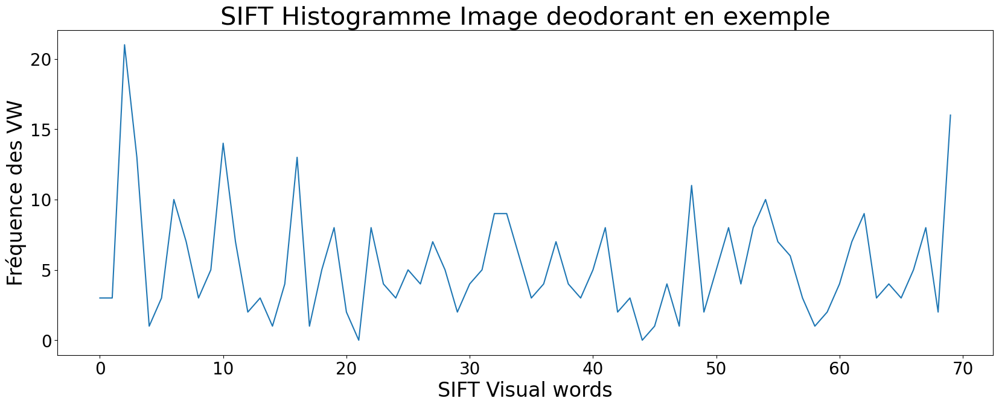

In [161]:
# Récupération de l'historgramme
df_visu = df_bovw[df_bovw['image'] ==
                       'fe1bd3e2be8112198506daecbac7dc5c.jpg']['sift_bovw']
histo_deodorant = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image deodorant en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_deodorant)
plt.show()

### Reduction de dimention des images (sans pca)

**TSNE**

In [162]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_img = tsne.fit_transform(im_features)

df_tsne_img = pd.DataFrame(tsne_results_img[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_img["class"] = image_data["category"]
print(df_tsne_img.shape)

(1048, 3)


**Visualisation**

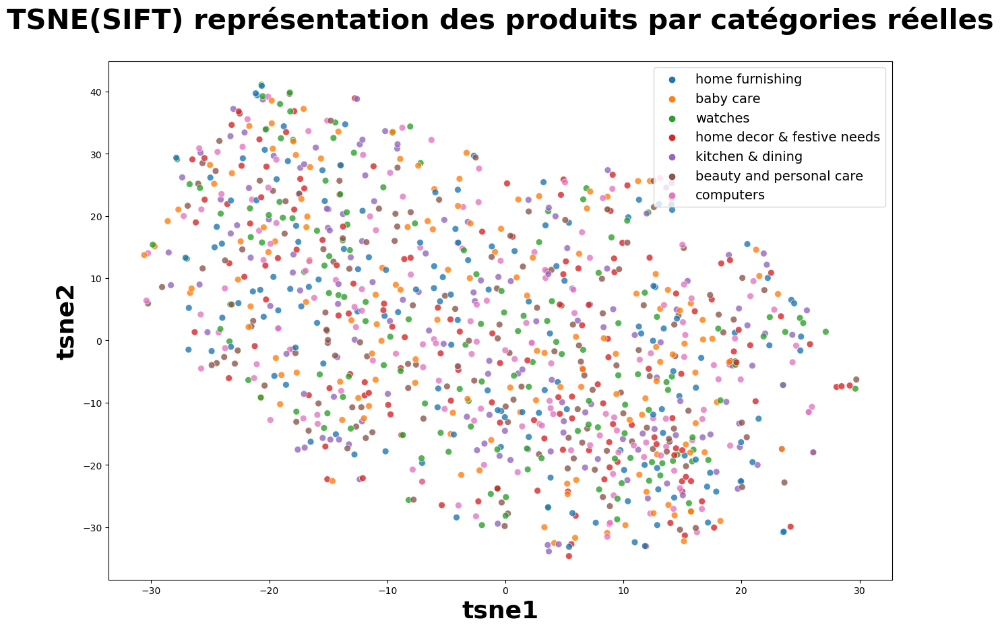

In [163]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

**CLUSTERING des images**

In [164]:
#Création de clusters à partir du T-SNE 
X = df_tsne_img[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_img["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.38923106


In [165]:
# Création des labels à partir du nom de catégory produit
le = preprocessing.LabelEncoder()
image_data["label"] = le.fit_transform(image_data["category"])

In [166]:
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'baby care': 0, 'beauty and personal care': 1, 'computers': 2, 'home decor & festive needs': 3, 'home furnishing': 4, 'kitchen & dining': 5, 'watches': 6}


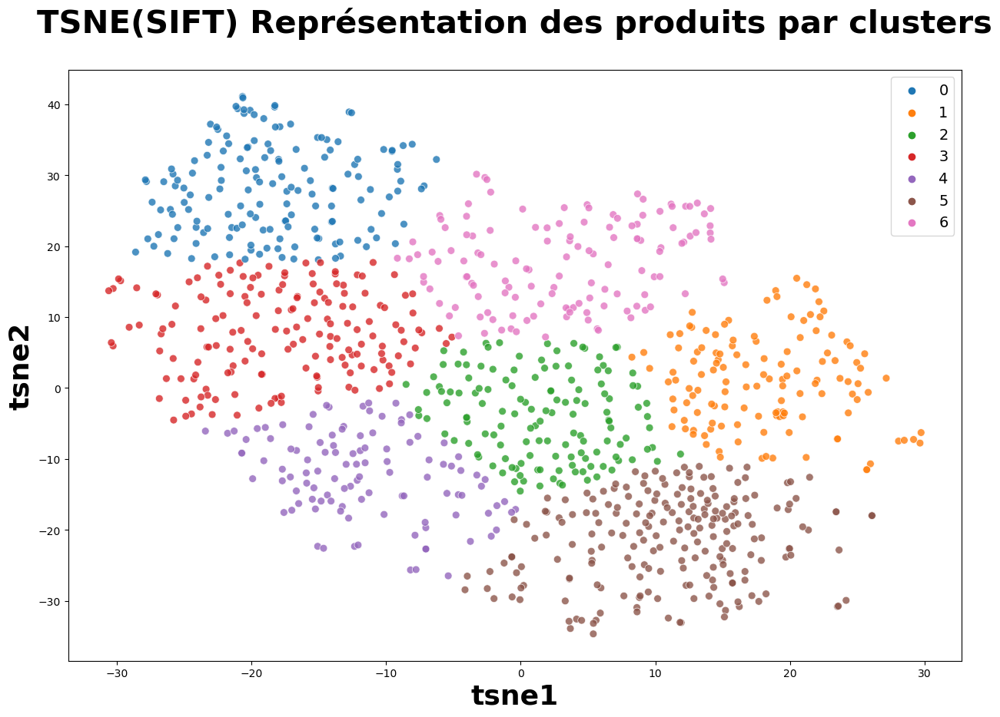

ARI :  0.0010309028189721516


In [167]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_img,
    legend="brief")

plt.title('TSNE(SIFT) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI est tres bas

### Reduction de dimention des images (avec pca) 

**PCA**

In [168]:
print("Dimensions avant PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_img = pca.fit_transform(im_features)
print("Dimensions après PCA : ", pca_results_img.shape)

Dimensions avant PCA :  (1048, 70)
Dimensions après PCA :  (1048, 58)


**TSNE**

Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [169]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_img = tsne.fit_transform(pca_results_img)

df_tsne_img = pd.DataFrame(tsne_results_img[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_img["class"] = image_data["category"]
print(df_tsne_img.shape)

(1048, 3)


**Visualisation**

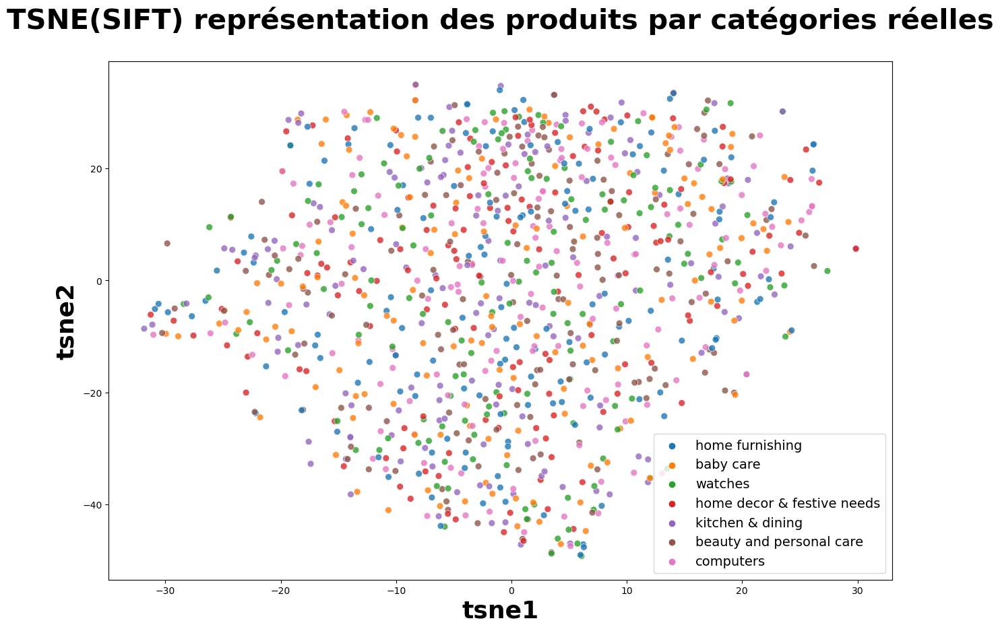

In [170]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

Le regroupement par catégories produits est moins perceptible que ce qu'on a pu observer sur les données textuelles

### CLUSTERING des images

In [171]:
#Création de clusters à partir du T-SNE 
X = df_tsne_img[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_img["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.3640694


In [172]:
# Création des labels à partir du nom de catégory produit
le = preprocessing.LabelEncoder()
image_data["label"] = le.fit_transform(image_data["category"])

In [173]:
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'baby care': 0, 'beauty and personal care': 1, 'computers': 2, 'home decor & festive needs': 3, 'home furnishing': 4, 'kitchen & dining': 5, 'watches': 6}


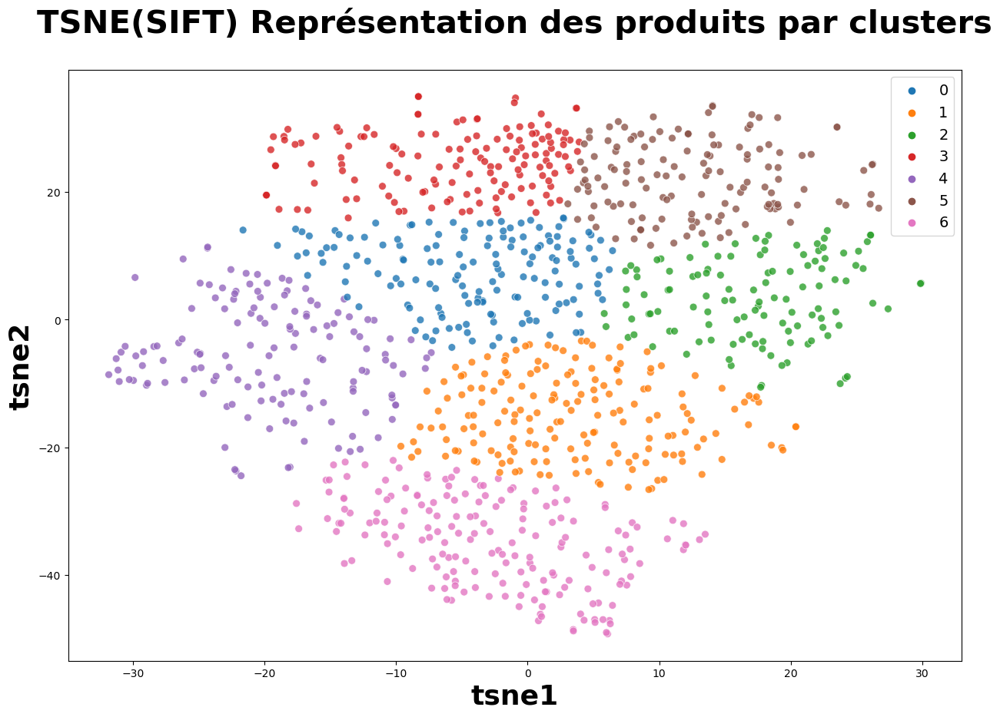

ARI :  -0.00014266715107880048


In [174]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_img,
    legend="brief")

plt.title('TSNE(SIFT) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

Le score ARI est très mauvais et la separation des clusters n'est pas bonne.

La classification avec les données images pouraient être améliorée en utilisant un algorithme de type CNN (Transfer Learning)

### CNN (VGG-16)

On va tester un algorithme de type CNN Transfer Learning en utilisant le modèle VGG-16.

VGG-16 est une version du réseau de neurones convolutif VGG-Net.



- Chargement des images, extraction des features (Preprocess each image according to the input accepted by the transfer learning model and convert each image to the respective vector by using the weights from the transfer learning model. Then flatten and store all the image weights in a list)

- Réduction de dimension (TSNE dimension reduction)

- Clustering (avec k-means)

**Chargement des images, extraction des features**

In [175]:
image_data['image_loc']

0       Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1       Images/7b72c92c2f6c40268628ec5f14c6d590.jpg
3       Images/d4684dcdc759dd9cdf41504698d737d8.jpg
4       Images/6325b6870c54cd47be6ebfbffa620ec7.jpg
5       Images/893aa5ed55f7cff2eccea7758d7a86bd.jpg
                           ...                     
1045    Images/958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046    Images/fd6cbcc22efb6b761bd564c28928483c.jpg
1047    Images/5912e037d12774bb73a2048f35a00009.jpg
1048    Images/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg
1049    Images/f2f027ad6a6df617c9f125173da71e44.jpg
Name: image_loc, Length: 1048, dtype: object

In [32]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine
# VGG16 imports
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array


# Liste
vgg16_all_features = []

# Instanciation du modèle
model = VGG16()
model_vgg16 = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in image_data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun d'objets connus.
    vgg16_feature = model_vgg16.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature))

vgg16_all_features = np.array(vgg16_all_features)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [33]:
pd.DataFrame([np.array(vgg16_all_features[i][0]) for i in range(image_data.shape[0])])

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,3.398614,0.859572,0.000000,1.106560,2.266122,2.927241,2.446448,0.000000,0.000000,0.000000,...,0.485876,0.0,0.000000,0.472938,0.875756,0.783684,0.000000,0.000000,0.851055,0.000000
1,0.000000,0.000000,0.000000,1.172009,0.000000,0.000000,0.000000,0.000000,0.000000,6.499799,...,1.169696,0.0,0.000000,0.000000,0.000000,3.152507,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.070991,0.000000,2.046283,0.000000,0.000000,0.000000,0.000000,0.000000,0.894023,...,0.000000,0.0,0.000000,0.000000,0.000000,3.977747,0.000000,0.000000,0.000000,0.000000
3,3.417152,0.000000,0.000000,0.000000,1.012359,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,9.195916,0.139736,0.000000,1.735950,0.000000
4,0.018236,0.000000,0.000000,0.377391,1.788112,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.195137,6.283000,0.000000,2.152100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,2.312268,2.432937,0.000000,1.860516,3.101232,2.369040,0.000000,0.000000,1.428848,1.286600,...,0.000000,0.0,0.058723,0.000000,0.000000,0.000000,0.859425,1.085387,0.000000,0.000000
1044,1.217184,0.365275,0.330849,0.000000,2.140628,0.000000,0.000000,0.767264,0.000000,3.563397,...,0.000000,0.0,0.837411,0.839075,0.000000,1.042109,0.000000,1.560315,0.000000,0.998342
1045,2.196130,2.398275,2.623641,0.983882,0.366652,0.535506,3.730995,0.000000,0.000000,0.000000,...,1.230694,0.0,0.000000,0.000000,0.000000,0.193308,0.546066,2.159872,0.184722,0.000000
1046,0.000000,0.000000,0.000000,0.000000,0.000000,0.388865,0.000000,0.000000,0.000000,1.612164,...,0.974809,0.0,2.205197,2.729846,0.000000,0.000000,0.000000,0.000000,0.248330,0.925138


In [34]:
np.array(vgg16_all_features[0][0])

array([3.3986144, 0.8595722, 0.       , ..., 0.       , 0.8510551,
       0.       ], dtype=float32)

In [35]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
image_data['vgg16_bovw'] = [vgg16_all_features[i] for i in range(image_data.shape[0])]

# New dataframe
df_vgg16_bovw = image_data[['image', 'image_loc', 'category', 'vgg16_bovw']]

# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame([np.array(vgg16_all_features[i][0]) for i in range(image_data.shape[0])])

## Réduction de dimension (sans PCA)

**TSNE**

In [36]:
#sans PCA
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_vgg16 = tsne.fit_transform(df_vgg16_vectors)

df_tsne_vgg16 = pd.DataFrame(tsne_results_vgg16[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] = image_data["category"]
print(df_tsne_vgg16.shape)

(1048, 3)


**Visualisation**

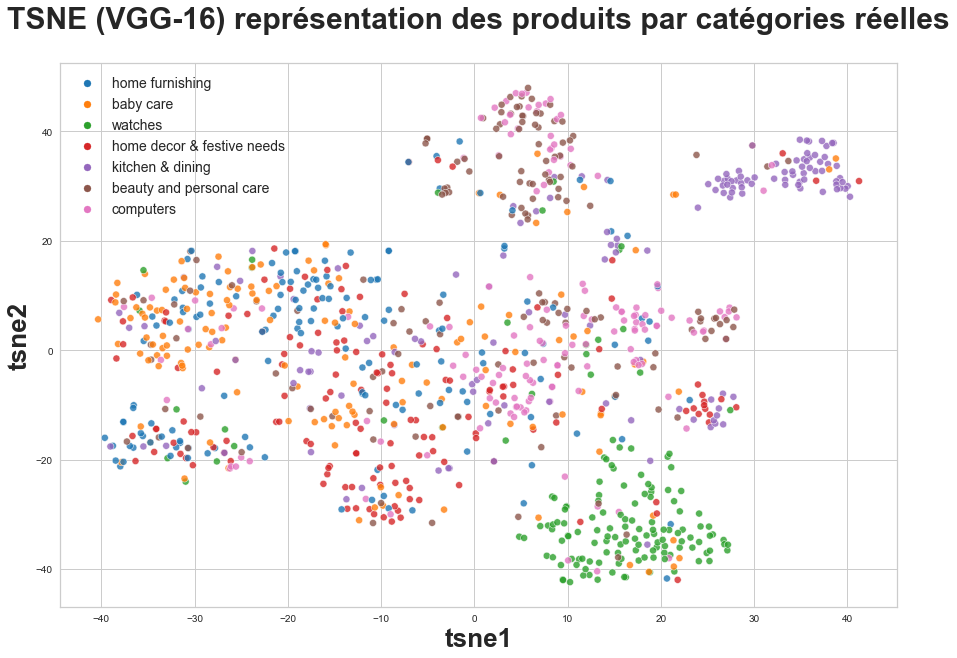

In [37]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

**Clustering sans pca**

In [38]:
#Création de clusters à partir du T-SNE 
X = df_tsne_vgg16[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_vgg16["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.48595664


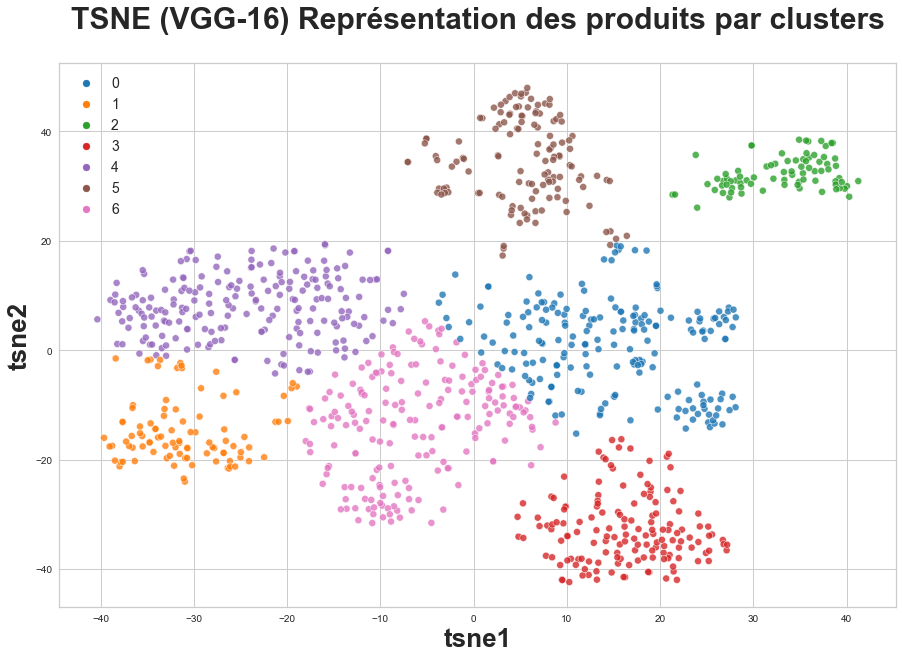

ARI :  0.4884179407481395


In [41]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI coefficient a considérablement augmenté

### Reduction de dimention avec PCA

**PCA**

In [184]:
print("Dimensions dataset avant réduction PCA : ", df_vgg16_vectors.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_vgg16 = pca.fit_transform(df_vgg16_vectors)
print("Dimensions dataset après réduction PCA : ", pca_results_vgg16.shape)

Dimensions dataset avant réduction PCA :  (1048, 4096)
Dimensions dataset après réduction PCA :  (1048, 801)


**TSNE**

In [185]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_vgg16 = tsne.fit_transform(pca_results_vgg16)

df_tsne_vgg16 = pd.DataFrame(tsne_results_vgg16[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] = image_data["category"]
print(df_tsne_vgg16.shape)

(1048, 3)


**Visualisation**

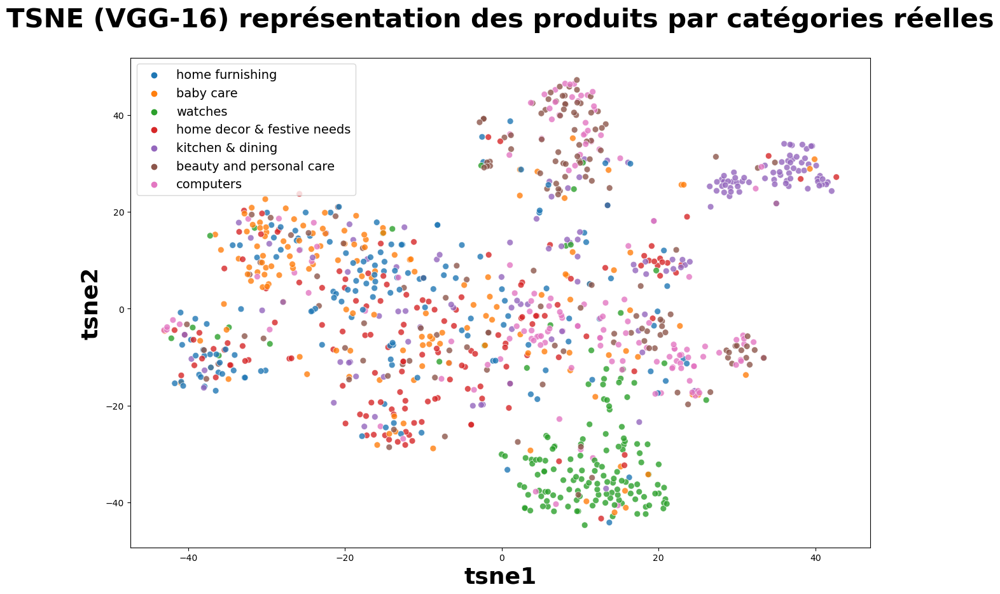

In [186]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

Le regroupement par catégories produits est meilleur que ce qu'on a pu observer sur les données SIFT

**Clustering**

In [187]:
#Création de clusters à partir du T-SNE 
X = df_tsne_vgg16[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_vgg16["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.4966709


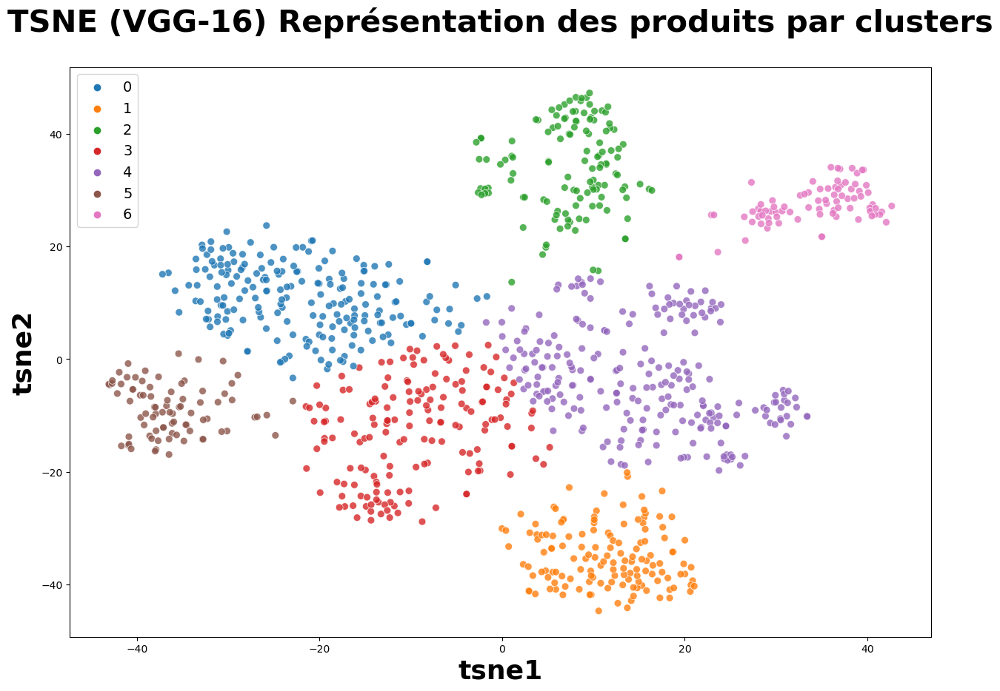

ARI :  0.505368323925754


In [188]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

Dans ce cas acp améliore un peu l'ARI

ARI a amélioré (par rapport à celui obtenu sur avec les features SIFT)

Les clusters sont separees mieux

L'aplication de PCA presque ne change pas le resultat

### CNN (ResNet50)

Residual Network

In [189]:
# ResNet50 imports
from tensorflow.keras.applications.resnet50 import ResNet50


# Liste
resnet50_all_features = []

# Instanciation du modèle
model = ResNet50()
model_resnet50 = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# Résumé de l'architecture du modèle
model_resnet50.summary()

for rep_image in image_data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun d'objets connus.
    resnet50_feature = model_resnet50.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    resnet50_all_features.append(np.array(resnet50_feature))

resnet50_all_features = np.array(resnet50_all_features)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [190]:
resnet50_all_features

array([[[1.6254028 , 0.23586479, 0.08362482, ..., 0.39845175,
         0.16431251, 0.7263404 ]],

       [[0.        , 0.        , 0.08359676, ..., 0.        ,
         0.08481713, 0.12934506]],

       [[0.        , 0.1661771 , 0.06219089, ..., 0.        ,
         0.        , 0.08004469]],

       ...,

       [[0.02315947, 0.4109698 , 0.23307522, ..., 2.3046923 ,
         0.27236643, 0.11859865]],

       [[0.21995626, 0.2318296 , 0.24972735, ..., 0.54590285,
         1.3941011 , 0.4029271 ]],

       [[0.1855923 , 0.24666998, 0.01405325, ..., 1.2345062 ,
         1.2957137 , 0.15796272]]], dtype=float32)

In [191]:
# Constituer le dataframe de vecteurs de resnet50
df_resnet50_vectors = pd.DataFrame([np.array(resnet50_all_features[i][0]) for i in range(image_data.shape[0])])

**Réduction de dimension**

**TSNE**

In [192]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_resnet50 = tsne.fit_transform(df_resnet50_vectors)

df_tsne_resnet50 = pd.DataFrame(tsne_results_resnet50[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_resnet50["class"] = image_data["category"]
print(df_tsne_resnet50.shape)

(1048, 3)


**Visualisation**

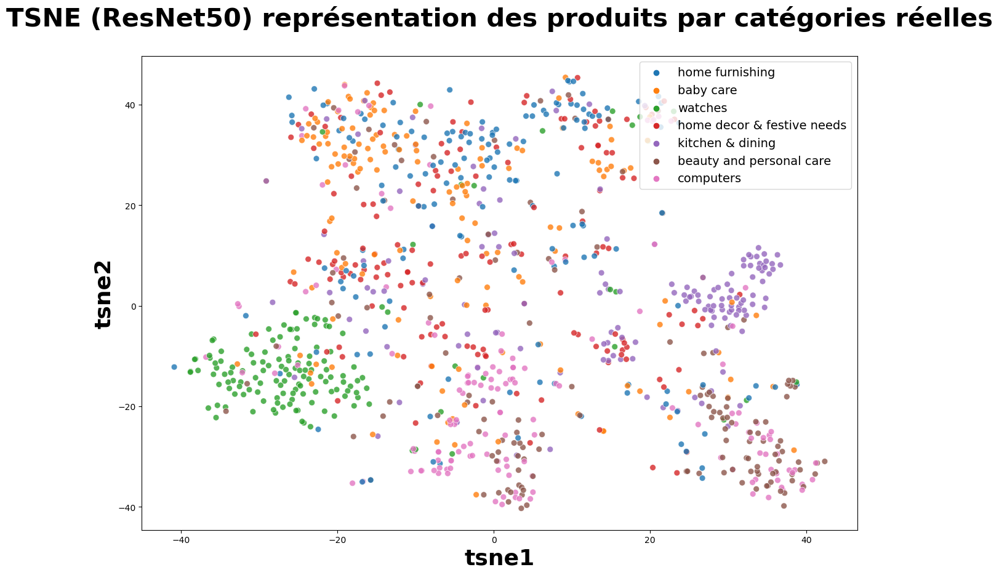

In [193]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_resnet50, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (ResNet50) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

Le regroupement par catégories produits est meilleur que ce qu'on a pu observer sur les données SIFT

**Clustering**

In [194]:
#Création de clusters à partir du T-SNE 
X = df_tsne_resnet50[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_resnet50["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.48108953


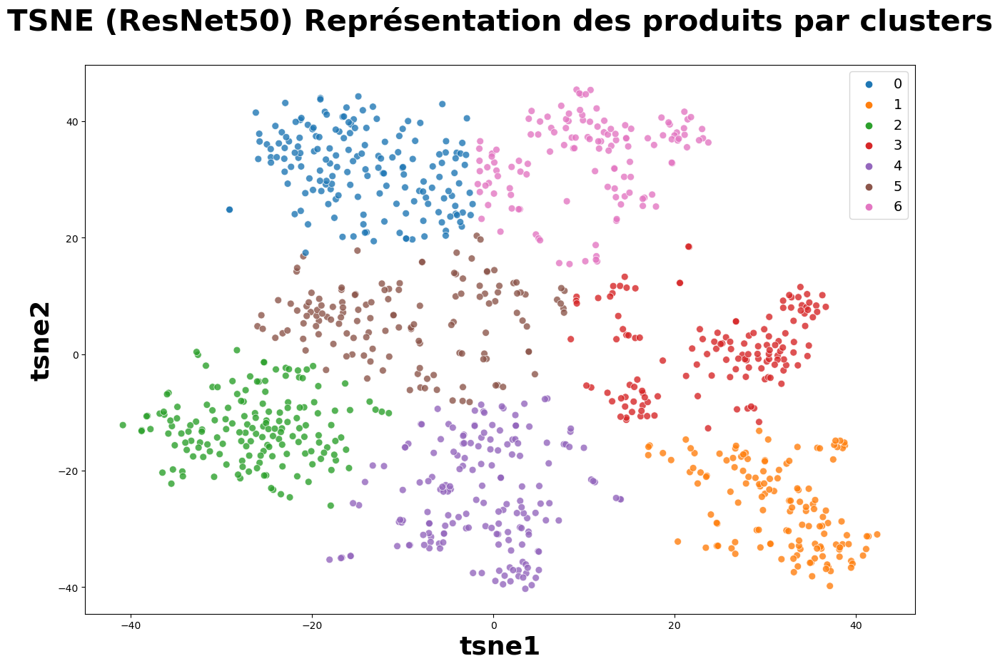

ARI :  0.5570806652405086


In [195]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_resnet50,
    legend="brief")

plt.title('TSNE (ResNet50) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI a amélioré (par rapport à celui obtenu sur avec les features vgg16)

Les clusters sont separees mieux

### CNN (InceptionV3)

GoogLeNet

In [196]:
# ResNet50 imports
from tensorflow.keras.applications.inception_v3 import InceptionV3


# Liste
inceptionv3_all_features = []

# Instanciation du modèle
model_inceptionv3 = InceptionV3(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_inceptionv3.summary()

for rep_image in image_data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun d'objets connus.
    inceptionv3_feature = model_inceptionv3.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    inceptionv3_all_features.append(np.array(inceptionv3_feature))

inceptionv3_all_features = np.array(inceptionv3_all_features)

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_5[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                    

In [197]:
inceptionv3_all_features

array([[[[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        , 13.3217325 ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        ,  6.098603  ,  0.        , ...,  0.        ,
            0.        ,  4.807984  ],
          [ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  5.3921323 ],
          [ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  2.319452  ]],

         [[ 0.        , 11.205013  ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        ,  0.        ,  0.        , ...,  0.        ,
            0.        ,  0.        ],
          [ 0.        ,  0.        ,  0.    

In [198]:
# Constituer le dataframe de vecteurs de resnet50
df_inceptionv3_vectors = pd.DataFrame([np.array(inceptionv3_all_features[i][0][0][0]) for i in range(image_data.shape[0])])

In [199]:
df_inceptionv3_vectors

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,0.000000,0.000000,0.000000,32.412678,34.417034,13.717959,8.378109,0.000000,0.00000,6.150981,...,4.901035,0.0,0.000000,44.445248,0.000000,9.948237,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.799628,0.000000,30.245571,0.000000,0.000000,0.00000,60.223022,...,0.000000,0.0,0.000000,0.000000,0.228358,0.882645,0.277861,20.179916,0.000000,11.283092
2,0.000000,0.000000,0.000000,0.000000,0.000000,41.360481,0.000000,15.161836,0.00000,88.547493,...,2.911690,0.0,39.588730,0.000000,0.000000,106.906578,0.000000,45.055626,41.659107,0.000000
3,7.372811,6.768928,1.676510,16.220837,47.307541,35.818386,0.000000,0.541050,0.00000,15.572609,...,10.977701,0.0,0.000000,10.126326,28.334452,8.004990,0.000000,4.243624,0.000000,0.000000
4,0.000000,6.657745,3.921785,0.000000,31.726767,65.300537,0.000000,0.000000,0.00000,120.695427,...,33.841812,0.0,0.804961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.049661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,30.524010,0.000000,32.815071,8.827328,0.000000,10.559257,28.065954,14.874469,0.33176,3.507502,...,0.000000,0.0,0.000000,30.723694,40.470467,27.986563,0.000000,0.000000,0.000000,0.000000
1044,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.147493,0.00000,21.406937,...,18.716511,0.0,0.000000,0.000000,1.956475,61.359688,3.458516,15.928669,11.624480,0.000000
1045,0.000000,0.000000,0.000000,1.569281,0.000000,24.907219,0.000000,0.000000,0.00000,13.208960,...,15.757468,0.0,0.000000,0.614105,26.254274,24.627327,0.000000,0.000000,0.000000,0.000000
1046,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,25.451685,...,0.000000,0.0,0.000000,0.000000,55.186840,0.000000,0.000000,0.000000,0.000000,22.241335


### Réduction de dimension

**TSNE**

In [200]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_inceptionv3 = tsne.fit_transform(df_inceptionv3_vectors)

df_tsne_inceptionv3 = pd.DataFrame(tsne_results_inceptionv3[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_inceptionv3["class"] = image_data["category"]
print(df_tsne_inceptionv3.shape)

(1048, 3)


**Visualisation**

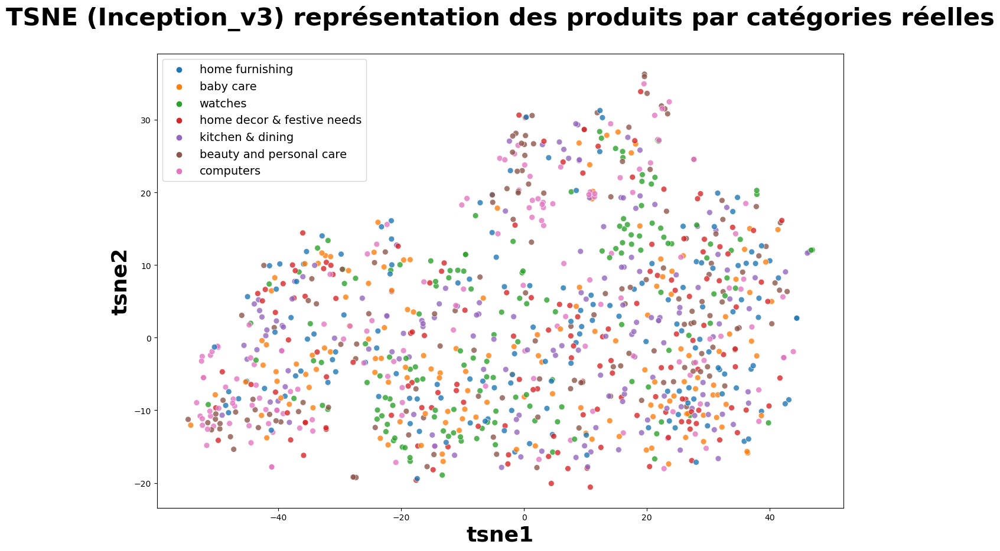

In [201]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_inceptionv3, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (Inception_v3) représentation des produits par catégories réelles', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

**Clustering**

In [202]:
#Création de clusters à partir du T-SNE 
X = df_tsne_inceptionv3[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_inceptionv3["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.40359718


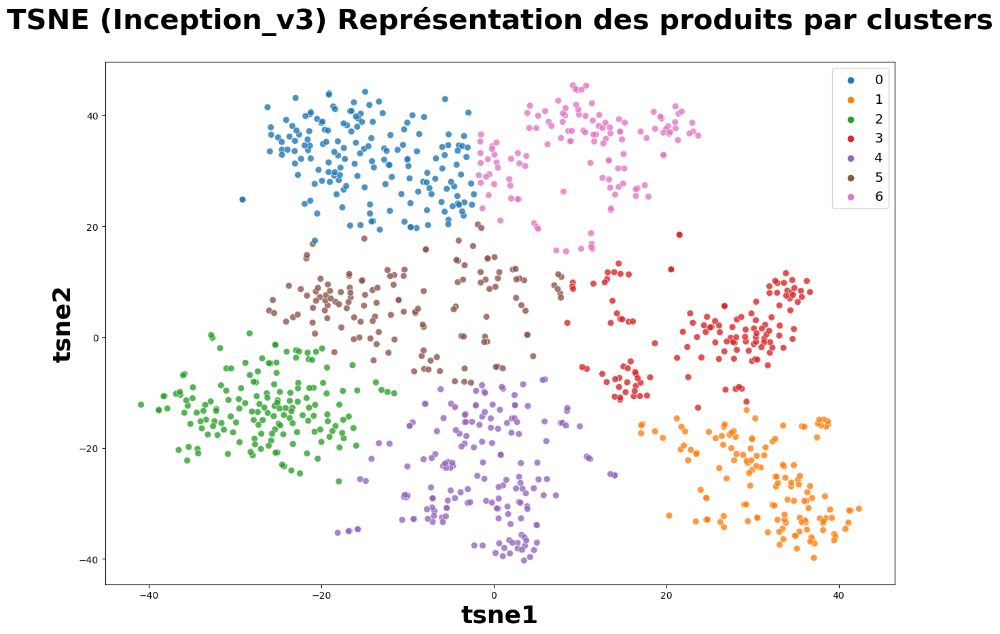

ARI :  0.03863525706343368


In [203]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_resnet50,
    legend="brief")

plt.title('TSNE (Inception_v3) Représentation des produits par clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = image_data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI est pire